In [1]:
# activate package, basic imports + load data
include("/Users/federicoclaudi/Documents/Github/LocomotionControl/analysis/behavior/analysis_fixtures.jl")
include("/Users/federicoclaudi/Documents/Github/LocomotionControl/analysis/behavior/analysis_visuals.jl")
using HypothesisTests
using Random , GLM

import jcontrol: movingaverage
import jcontrol as jc


  Activating project at `~/Documents/Github/LocomotionControl/analysis/behavior`


@Info (Main):  Loaded 1021 trials 


  ╰──────────────────────────────────────────────── 


                      Fri, 20 May 2022 15:11:39 
@Info (Main):  After tortuosity analysis, discarded 9.109% of trials | 928

 
  │                trials left 
  ╰──────────────────────────────────────────────── 
                      Fri, 20 May 2022 15:11:45 


plot tracking over curves

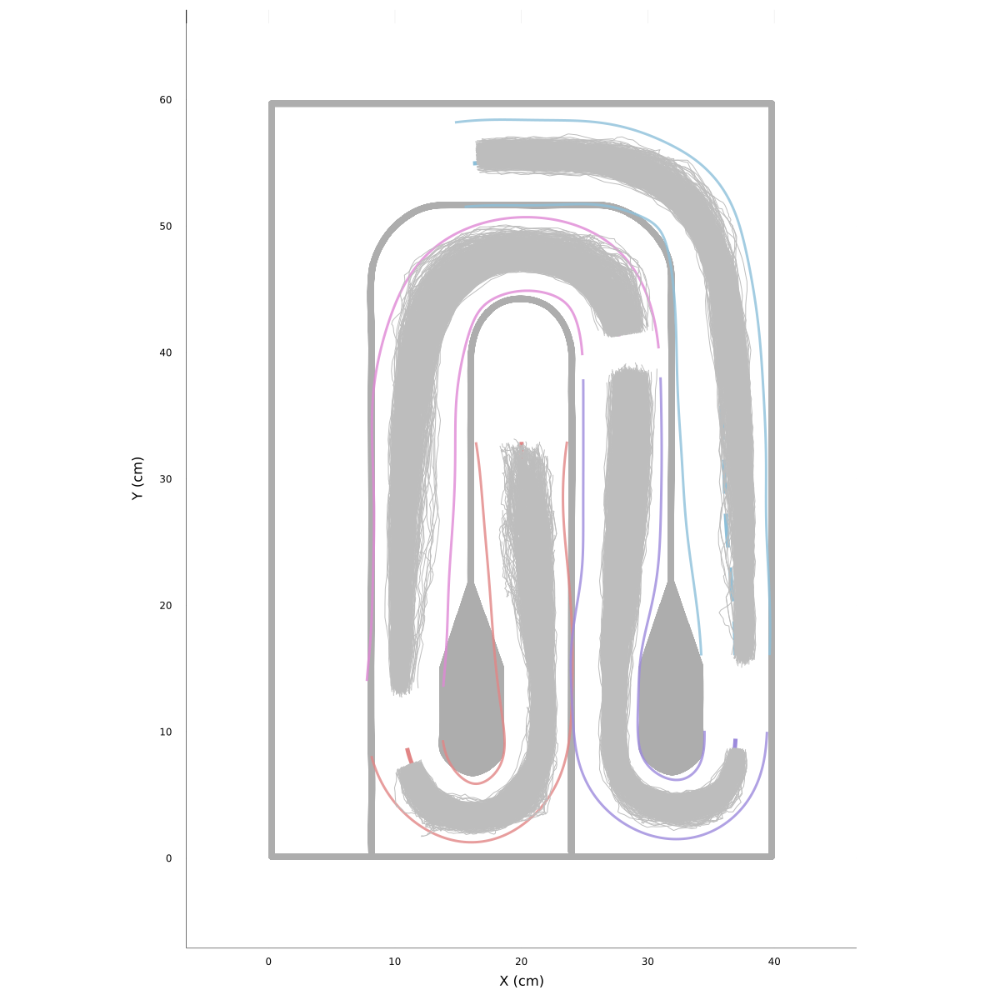

In [2]:
# for each curve, plot the tracking that belong to it
plt = draw(:arena)

for (i, curve) in enumerate(curves)
    track = jc.trim(FULLTRACK, curve.s0, curve.sf-curve.s0)
    draw!(track, color=curves_colors[i], Δp=50, alpha=1)

    for trial in trials
        _, _, start, stop = get_curve_indices(trial, curve.s0, curve.sf)

        plot!(
            trial.x[start:stop], trial.y[start:stop], color=grey, label=nothing
        )

    end

end

savefig(joinpath(PLOTS_FOLDER, "curves_with_tracking.svg"))
plt

get slowing down/turning

In [3]:
# initialize empty data store
function initialize_df()
    return Dict(
        "curve_id" => [],
        "class" => [],  # slowing down/turning
        "x" => [],
        "y" => [],
        "s" => [],
        "u" => [],
        "ω" => [],
        "u̇" => [],
        "t0" => [],
        "tpeak" => [],
        "t1" => [],
        "trial_num" => [],
    )
end


function append_data(data_df, trial, I, cidx, class, u̇, t0, tpeak, t1, trial_num)
    push!(data_df["curve_id"], cidx)
    push!(data_df["class"], class)
    push!(data_df["x"], trial.x[I-1])
    push!(data_df["y"], trial.y[I-1])
    push!(data_df["s"], trial.s[I-1])
    push!(data_df["u"], mean(trial.u[I-6:I+5]))
    push!(data_df["ω"], mean(trial.ω[I-6:I+5]))
    push!(data_df["u̇"], u̇ * 60)
    push!(data_df["t0"], t0)
    push!(data_df["tpeak"], tpeak)
    push!(data_df["t1"], t1)
    push!(data_df["trial_num"], trial_num)
end


# get when the mice start slowing down
function get_start_slowing_down(trials, data_df)
    plots = []

    kept = 0
    for cidx in 1:length(curves)
        curve = curves[cidx]
        s0 = curve.s0
        s1 = curve.s
        
        plt = plot()
    
        peaks_s, peaks_values = [], []
        for tn in 1:length(trials)
            trial = trials[tn]
            idxs, idx = get_curve_indices(trial, s0, s1)
    
            u = movingaverage(trial.u, SMOOTHING_WINDOW_LEN)[idxs]
    
            _idxs, _ = get_curve_indices(trial, s0, curve.sf)
            plot!(trial.s[idxs], u, color="black", alpha=.1, label=nothing)
    
            duration = length(u) / 60
            (duration > curve.maxdur || duration < .3) && continue
    
            switchpoint = argmax(u)
            I = switchpoint + idx
            I = max(I, 10)
    
            # get additional info
            info = Dict(
                "mean_u̇" => mean(diff(u[switchpoint:end]))
            )
    
            u̇ = mean(diff(filter(!isnan, u[switchpoint:end])))
            append_data(data_df, trial, I, cidx, "slowing", u̇, idx, I-1, idx+length(u), tn)
            push!(peaks_s, trial.s[I-1])
            push!(peaks_values, trial.u[I-1])
            kept += 1
        end
    
        # scatter position of u̇ peaks
        scatter!(
            peaks_s, peaks_values, color="red", label=nothing, alpha=1
        )
        plot!([s0, s0], [-10, 100], lw=2, color="blue", label="s0", title="Curve $cidx")
        plot!([curve.s, curve.s], [-10, 100], lw=2, color="green", label="apex")
        plot!([curve.sf, curve.sf], [-10, 100], lw=2, color="red", label="curve end")
        push!(plots, plt)
    end
    
    
    
    @info "Kept $kept trials/curves combos"
    return plot(
        plots...; size=(1200, 1000)
    )
end


function get_start_of_turning(trials, data_df)
    plots = []
    kept = 0
    for cidx in 1:length(curves)
        curve = curves[cidx]
        s0 = curve.s0
        s1 = curve.s
        
        plt = plot()

        peaks_s, peaks_values = [], []
        for tn in 1:length(trials)
            trial = trials[tn]
            idxs, idx = get_curve_indices(trial, s0, s1)

            s = movingaverage(trial.s[idxs], SMOOTHING_WINDOW_LEN)
            ω = movingaverage(trial.ω[idxs], SMOOTHING_WINDOW_LEN) .* curve.direction
            plot!(trial.s[idxs], ω, color="black", alpha=.1, label=nothing)

            duration = length(ω) / 60
            (duration > curve.maxdur || duration < .3) && continue

            # get when it starts turning
            th = 2.0
            switchpoint = nothing
            while isnothing(switchpoint) && th > 0
                switchpoint = findfirst((ω .> th) .& (s .> curve.tpos))
                th -= .05
            end

            t0 = findfirst(s .> curve.tpos)
            I = switchpoint + idx

            append_data(data_df, trial, I, cidx, "turning", 0.0, idx+t0, I-1, idx+length(ω), tn)
            push!(peaks_s, trial.s[I-1])
            push!(peaks_values, trial.ω[I-1] * curve.direction)
            kept += 1
        end

        # scatter position of u̇ peaks
        scatter!(
            peaks_s, peaks_values, color="red", label=nothing, alpha=1
        )
        plot!([s0, s0], [-10, 10], lw=2, color="blue", label="s0")

        plot!([curve.s, curve.s], [-10, 10], lw=2, color="green", label="curve", title="Curve $cidx", xlim=[s0, s1], ylim=[-12, 12])
        plot!([curve.tpos, curve.tpos], [-10, 10], lw=2, color="red", label="turn s0")

        hline!([1.5], color="black", lw=2)

        push!(plots, plt)
    end

    @info "Kept $kept trials/curves combos"

    return plot(
        plots..., size=(1200, 1000)
    )

end



get_start_of_turning (generic function with 1 method)

In [4]:
SMOOTHING_WINDOW_LEN = 6


# collect data
data_df = initialize_df()
p1 = get_start_slowing_down(trials, data_df)
p2 = get_start_of_turning(trials, data_df)

# put data together
df = DataFrame(data_df)
df[!,:class] = convert.(String,df[!,:class])

for col in (:curve_id, :t0, :t1, :tpeak, :trial_num)
    df[!,col] = convert.(Int,df[!,col])
end

for col in (:x, :y, :s, :u, :ω, :u̇)
    df[!, col] = convert.(Float64, df[!, col])
end

nothing

@Info (Main.get_start_slowing_down):  Kept 3668 trials/curves combos 
  ╰──────────────────────────────────────────────── 
                      Fri, 20 May 2022 15:13:38 
@Info (Main.get_start_of_turning):  Kept 3668 trials/curves combos

 
  ╰──────────────────────────────────────────────── 
                      Fri, 20 May 2022 15:13:50 


# Figure 3

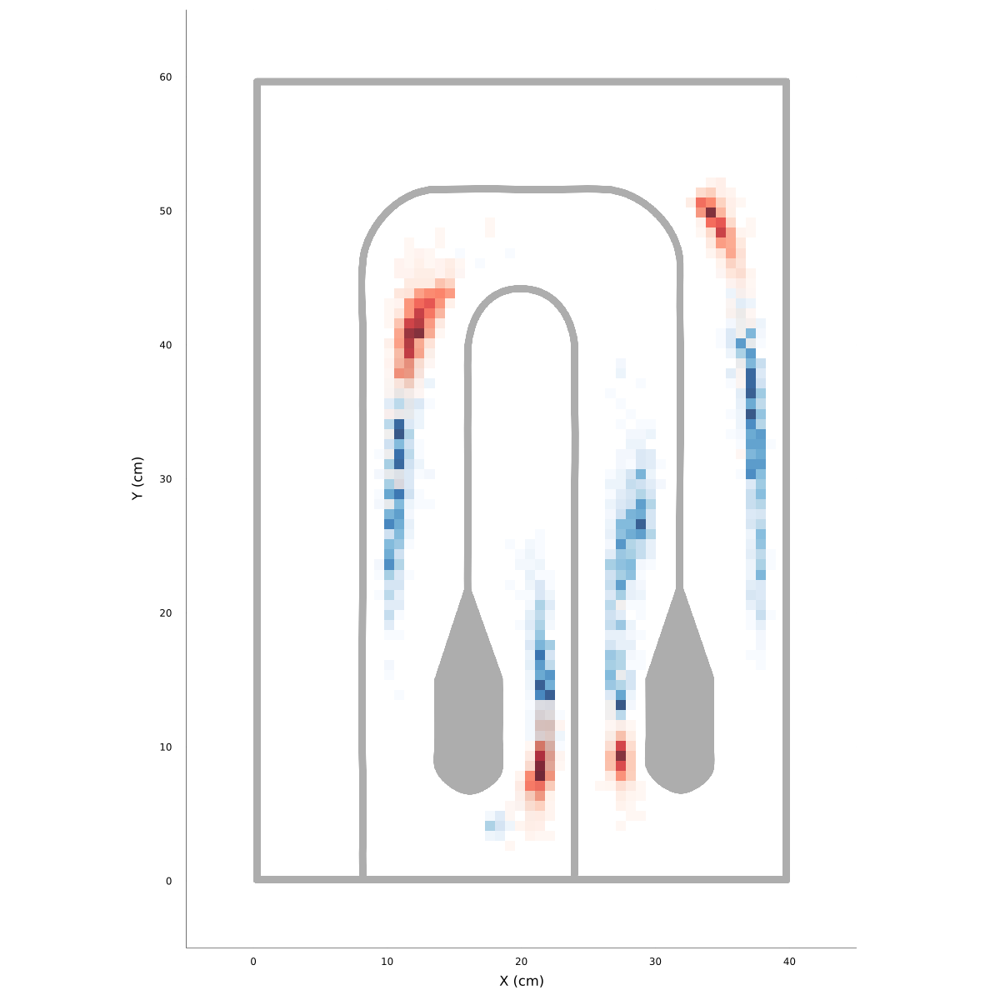

In [5]:
plt = draw(:arena)

xbins = 0:.75:40
ybins = 0:.75:60

for i in 1:length(curves)
    slowing = filterdf(df, :curve_id, i, :class, "slowing")
    turning = filterdf(df, :curve_id, i, :class, "turning")

    histogram2d!(slowing.x, slowing.y, bins=(xbins, ybins),  alpha=.8, c=:Blues, colorbar_entry=false)
    histogram2d!(turning.x, turning.y, bins=(xbins, ybins),  alpha=.8, c=:Reds, colorbar_entry=false)    
end

savefig(joinpath(PLOTS_FOLDER, "slowing_turning_2D_histo.svg"))
plt

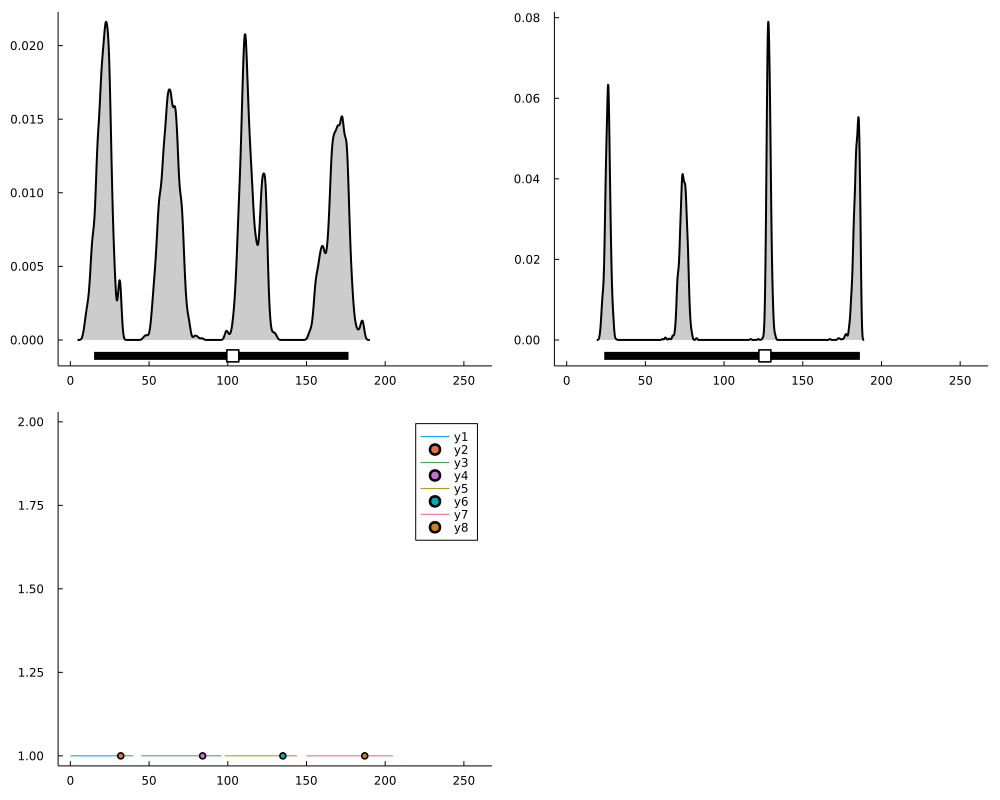

In [6]:
# plot positions wrt linearized coordinates
slowing = filterdf(df, "class", "slowing")
turning = filterdf(df, "class", "turning")


p1 = plot_kde_and_CI(slowing.s)

p2 = plot_kde_and_CI(turning.s; bandwidth=.5)


p3 = plot()
for curve in curves
    plot!([curve.s0, curve.sf], [1, 1])
    scatter!([curve.s], [1])
end

fig = plot(p1, p2, p3,  size=(1000, 800),  grid=false, xlim=[0, 260])
savefig(fig, joinpath(PLOTS_FOLDER, "slowing_turning_linearized.svg"))
fig

distance/time between slowing and turning

# Figure 4

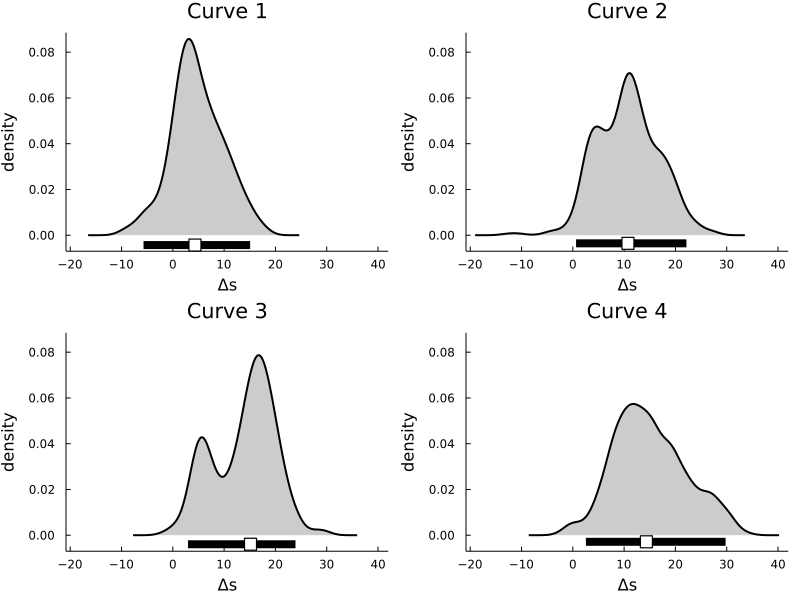

In [7]:
# plot Δs for each curve
plots = []
for curve_idx in 1:4
    slowing = filterdf(df, "curve_id", curve_idx, "class", "slowing")
    turning = filterdf(df, "curve_id", curve_idx, "class", "turning")

    @assert size(slowing) == size(turning) "wtf at curve $curve_idx"

    Δs = turning.s .- slowing.s
    plt = plot_kde_and_CI(Δs, bandwidth = 1.5)
    plot!(; xlabel="Δs", ylabel="density", title="Curve $curve_idx", legend=false)
    push!(plots, plt)

end

fig = plot(plots...; size=(800, 600), link=:all, grid=false)
savefig(fig, joinpath(PLOTS_FOLDER, "slow_turn_Δs_KDEs.svg"))
fig

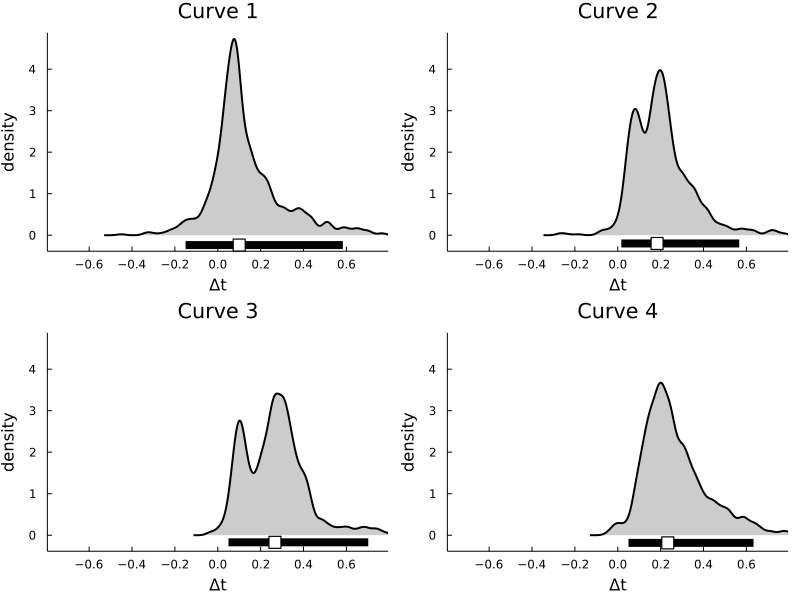

In [8]:
# plot Δt for each curve
plots = []
for curve_idx in 1:4
    slowing = filterdf(df, "curve_id", curve_idx, "class", "slowing")
    turning = filterdf(df, "curve_id", curve_idx, "class", "turning")

    @assert size(slowing) == size(turning)

    Δt = (turning.tpeak .- slowing.tpeak) ./ 60
    plt = plot_kde_and_CI(Δt, bandwidth = .02)
    plot!(; xlabel="Δt", ylabel="density", title="Curve $curve_idx", legend=false, xlim=[-.75, .75])
    push!(plots, plt)


end

fig = plot(plots...; size=(800, 600), link=:all, grid=false)
savefig(fig, joinpath(PLOTS_FOLDER, "slow_turn_Δt_KDEs.svg"))
fig

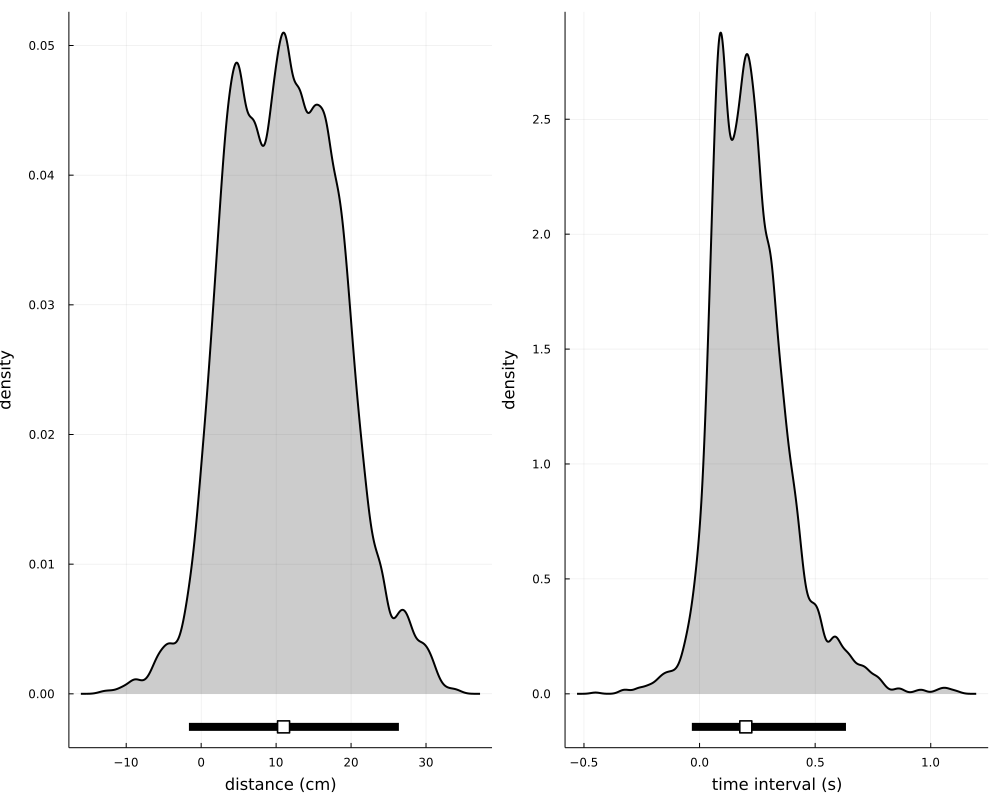

In [9]:
# plot pooling across curves
slowing = filterdf(df, "class", "slowing")
turning = filterdf(df, "class", "turning")


Δs = turning.s .- slowing.s
Δt = (turning.tpeak .- slowing.tpeak) ./ 60


p1 = plot_kde_and_CI(Δs, bandwidth = .75)
plot!(; xlabel="distance (cm)", ylabel="density")

p2 = plot_kde_and_CI(Δt, bandwidth = 0.02)
plot!(; xlabel="time interval (s)", ylabel="density")

fig = plot!(p1, p2, size=(1000, 800))
savefig(fig, joinpath(PLOTS_FOLDER, "slow_turn_Δ_KDEs_global.svg"))
fig